In [133]:
import warnings
warnings.filterwarnings("ignore")

import gc
import time
from math import log, floor
from tqdm.notebook import tqdm as tqdm
from datetime import datetime, timedelta
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pywt
from statsmodels.robust import mad
import scipy
from scipy import signal
from scipy.signal import butter, deconvolve

from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, PowerTransformer
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from prophet import Prophet

import os
import math
import datetime
import random

In [14]:
calendar_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\calendar.csv')
sales_price_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\sales_price.csv')
sales_train_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\sales_train.csv')

In [16]:
# Quick checks
print(calendar_df.shape, sales_price_df.shape, sales_train_df.shape)

(1969, 14) (6841121, 4) (30490, 1947)


In [18]:
# Check for nulls and duplicates
print(calendar_df.isna().sum(), calendar_df.duplicated().sum())
print(sales_price_df.isna().sum(), sales_price_df.duplicated().sum())
print(sales_train_df.isna().sum(), sales_train_df.duplicated().sum())

date               0
wm_yr_wk           0
weekday            0
wday               0
month              0
year               0
d                  0
event_name_1    1807
event_type_1    1807
event_name_2    1964
event_type_2    1964
snap_CA            0
snap_TX            0
snap_WI            0
dtype: int64 0
store_id      0
item_id       0
wm_yr_wk      0
sell_price    0
dtype: int64 0
id          0
item_id     0
dept_id     0
cat_id      0
store_id    0
           ..
d_1937      0
d_1938      0
d_1939      0
d_1940      0
d_1941      0
Length: 1947, dtype: int64 0


In [26]:
# Sample time series
ids = sorted(list(set(sales_train_df['id'])))
d_cols = [c for c in sales_train_df.columns if 'd_' in c]

def create_random_sample():
    rlist = np.random.randint(0, len(ids), size=4)
    samples = [sales_train_df.loc[sales_train_df['id'] == ids[r]].set_index('id')[d_cols].values[0] for r in rlist]
    return samples

sample_1, sample_2, sample_3, sample_4 = create_random_sample()

In [28]:
color_list = ["aliceblue", "antiquewhite", "aqua", "aquamarine", "azure", "beige", "bisque",
              "black", "blanchedalmond", "blue", "blueviolet", "brown", "burlywood", "cadetblue",
              "chartreuse", "chocolate", "coral", "cornflowerblue", "cornsilk", "crimson", "cyan",
              "darkblue", "darkcyan", "darkgoldenrod", "darkgray", "darkgrey", "darkgreen", "darkkhaki",
              "darkmagenta", "darkolivegreen", "darkorange", "darkorchid", "darkred", "darksalmon", "darkseagreen",
              "darkslateblue", "darkslategray", "darkslategrey", "darkturquoise", "darkviolet", "deeppink", "deepskyblue", "dimgray",
              "dimgrey", "dodgerblue", "firebrick", "floralwhite", "forestgreen", "fuchsia"]

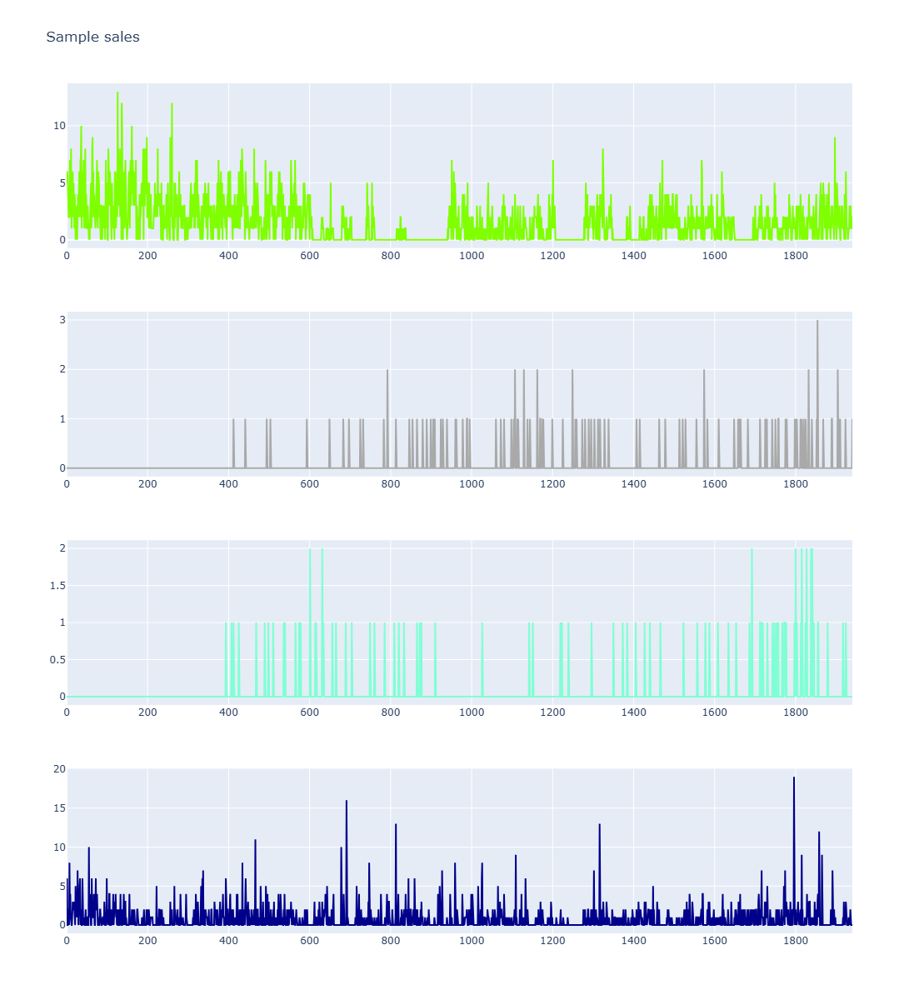

In [30]:
rc_list = random.choices(color_list, k=4)
rc_list[0]
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_1)), y=sample_1, showlegend=False,
                    mode='lines', name="First sample",
                         marker=dict(color=rc_list[0])),
             row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_2)), y=sample_2, showlegend=False,
                    mode='lines', name="Second sample",
                         marker=dict(color=rc_list[1])),
             row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_3)), y=sample_3, showlegend=False,
                    mode='lines', name="Third sample",
                         marker=dict(color=rc_list[2])),
             row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(sample_4)), y=sample_4, showlegend=False,
                    mode='lines', name="Third sample",
                         marker=dict(color=rc_list[3])),
             row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="Sample sales")
fig.show()

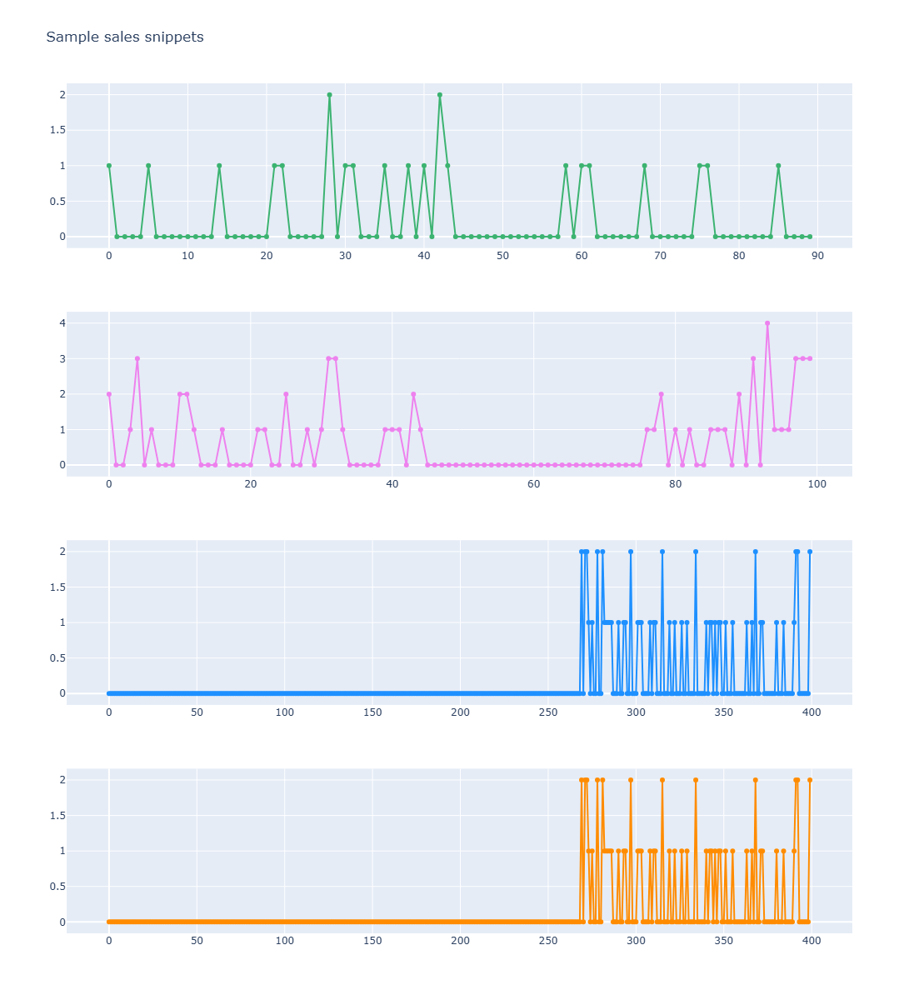

In [32]:
r_list = random.choices(ids, k=4)

sample_1 = sales_train_df.loc[sales_train_df['id'] == r_list[0]].set_index('id')[d_cols].values[0][:90]
sample_2 = sales_train_df.loc[sales_train_df['id'] == r_list[1]].set_index('id')[d_cols].values[0][1300:1400]
sample_3 = sales_train_df.loc[sales_train_df['id'] == r_list[2]].set_index('id')[d_cols].values[0][350:450]
sample_3 = sales_train_df.loc[sales_train_df['id'] == r_list[3]].set_index('id')[d_cols].values[0][700:1100]

fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_1)), y=sample_1, showlegend=False,
                    mode='lines+markers', name="First sample",
                         marker=dict(color="mediumseagreen")),
             row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_2)), y=sample_2, showlegend=False,
                    mode='lines+markers', name="Second sample",
                         marker=dict(color="violet")),
             row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(sample_3)), y=sample_3, showlegend=False,
                    mode='lines+markers', name="Third sample",
                         marker=dict(color="dodgerblue")),
             row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(len(sample_3)), y=sample_3, showlegend=False,
                    mode='lines+markers', name="Third sample",
                         marker=dict(color="darkorange")),
             row=4, col=1)

fig.update_layout(height=1200, width=800, title_text="Sample sales snippets")
fig.show()

In [34]:
def maddest(d, axis=None):
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)
    
def denoise_signal(x, wavelet='db4', level=1):
    coeff = pywt.wavedec(x, wavelet, mode="per")
    sigma = (1/0.6745) * maddest(coeff[-level])

    uthresh = sigma * np.sqrt(2*np.log(len(x)))
    coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])

    return pywt.waverec(coeff, wavelet, mode='per')

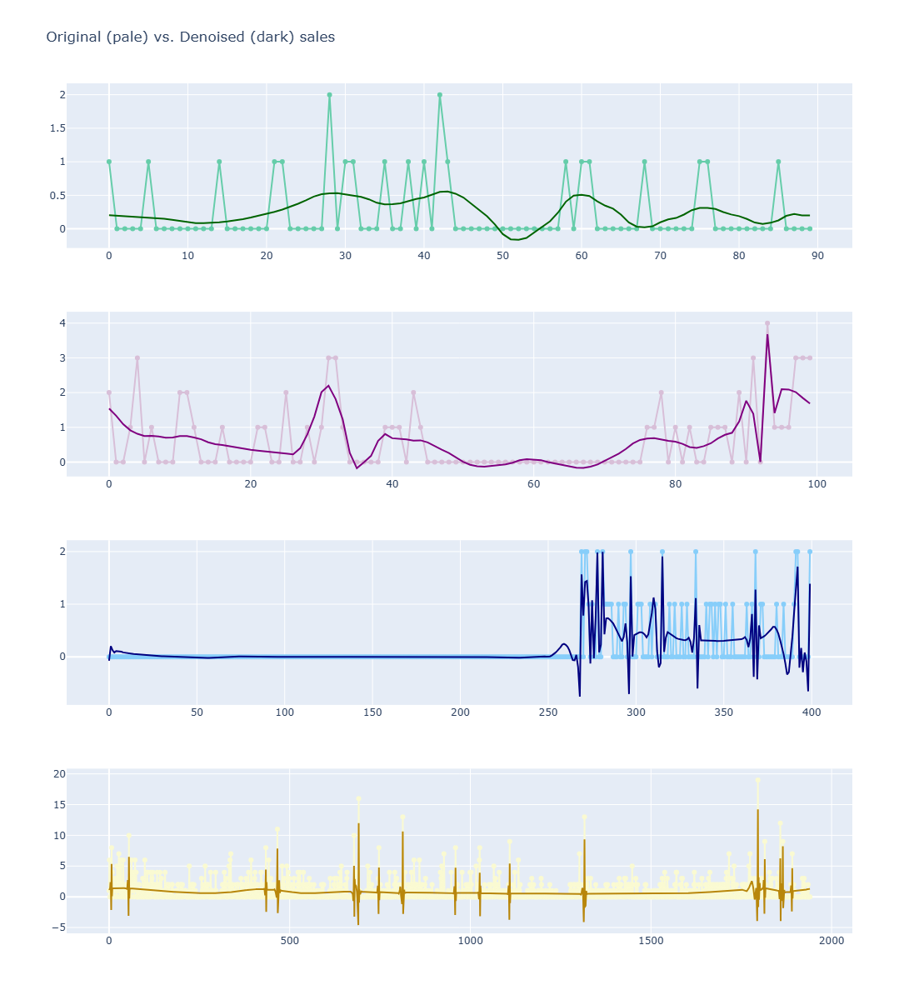

In [36]:
y_w1 = denoise_signal(sample_1)
y_w2 = denoise_signal(sample_2)
y_w3 = denoise_signal(sample_3)
y_w4 = denoise_signal(sample_4)

fig = make_subplots(rows=4, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_1)), mode='lines+markers', y=sample_1, marker=dict(color="mediumaquamarine"), showlegend=False,
               name="Original signal"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_1)), y=y_w1, mode='lines', marker=dict(color="darkgreen"), showlegend=False,
               name="Denoised signal"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_2)), mode='lines+markers', y=sample_2, marker=dict(color="thistle"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_2)), y=y_w2, mode='lines', marker=dict(color="purple"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_3)), mode='lines+markers', y=sample_3, marker=dict(color="lightskyblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_3)), y=y_w3, mode='lines', marker=dict(color="navy"), showlegend=False),
    row=3, col=1
)


fig.add_trace(
    go.Scatter(x=np.arange(len(sample_4)), mode='lines+markers', y=sample_4, marker=dict(color="lightgoldenrodyellow"), showlegend=False),
    row=4, col=1
)
fig.add_trace(
    go.Scatter(x=np.arange(len(sample_4)), y=y_w4, mode='lines', marker=dict(color="darkgoldenrod"), showlegend=False),
    row=4, col=1
)
fig.update_layout(height=1200, width=800, title_text="Original (pale) vs. Denoised (dark) sales")
fig.show()

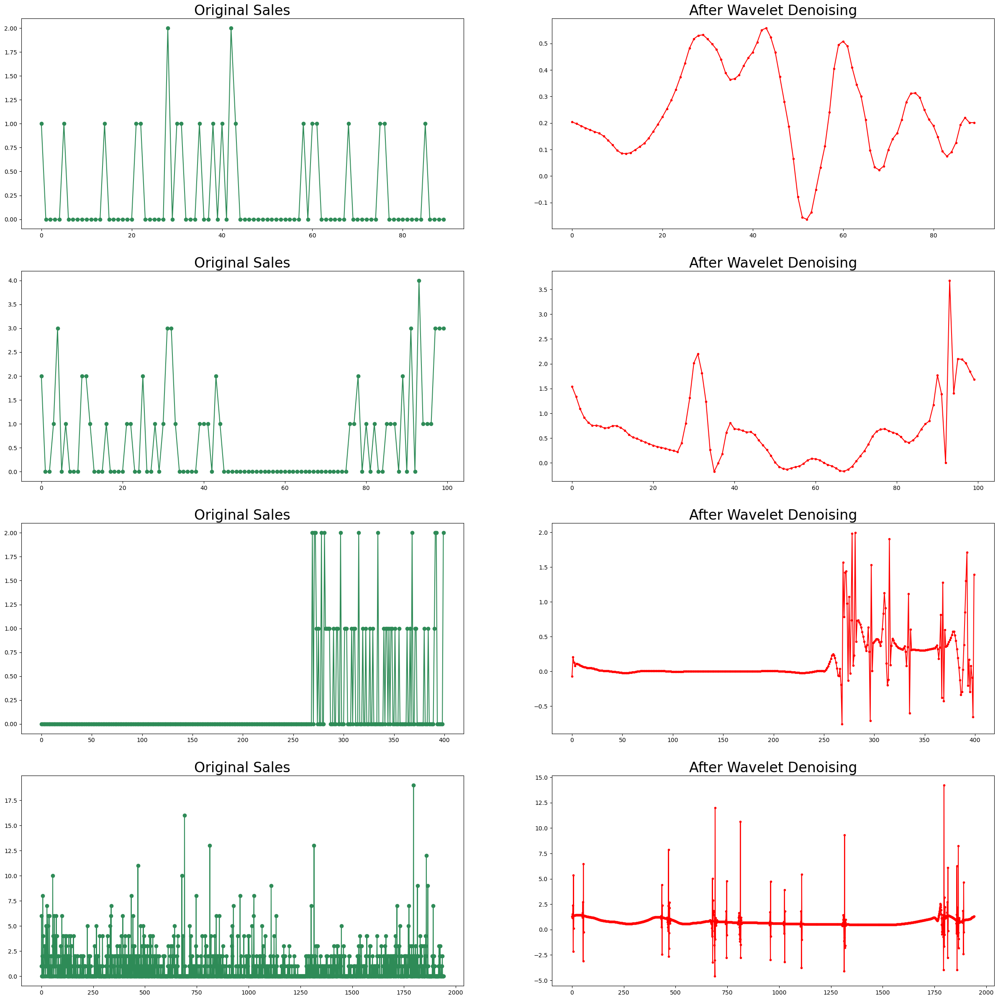

In [38]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(30, 30))

ax[0, 0].plot(sample_1, color='seagreen', marker='o') 
ax[0, 0].set_title('Original Sales', fontsize=24)
ax[0, 1].plot(y_w1, color='red', marker='.') 
ax[0, 1].set_title('After Wavelet Denoising', fontsize=24)

ax[1, 0].plot(sample_2, color='seagreen', marker='o') 
ax[1, 0].set_title('Original Sales', fontsize=24)
ax[1, 1].plot(y_w2, color='red', marker='.') 
ax[1, 1].set_title('After Wavelet Denoising', fontsize=24)

ax[2, 0].plot(sample_3, color='seagreen', marker='o') 
ax[2, 0].set_title('Original Sales', fontsize=24)
ax[2, 1].plot(y_w3, color='red', marker='.') 
ax[2, 1].set_title('After Wavelet Denoising', fontsize=24)

ax[3, 0].plot(sample_4, color='seagreen', marker='o') 
ax[3, 0].set_title('Original Sales', fontsize=24)
ax[3, 1].plot(y_w4, color='red', marker='.') 
ax[3, 1].set_title('After Wavelet Denoising', fontsize=24)

plt.show()

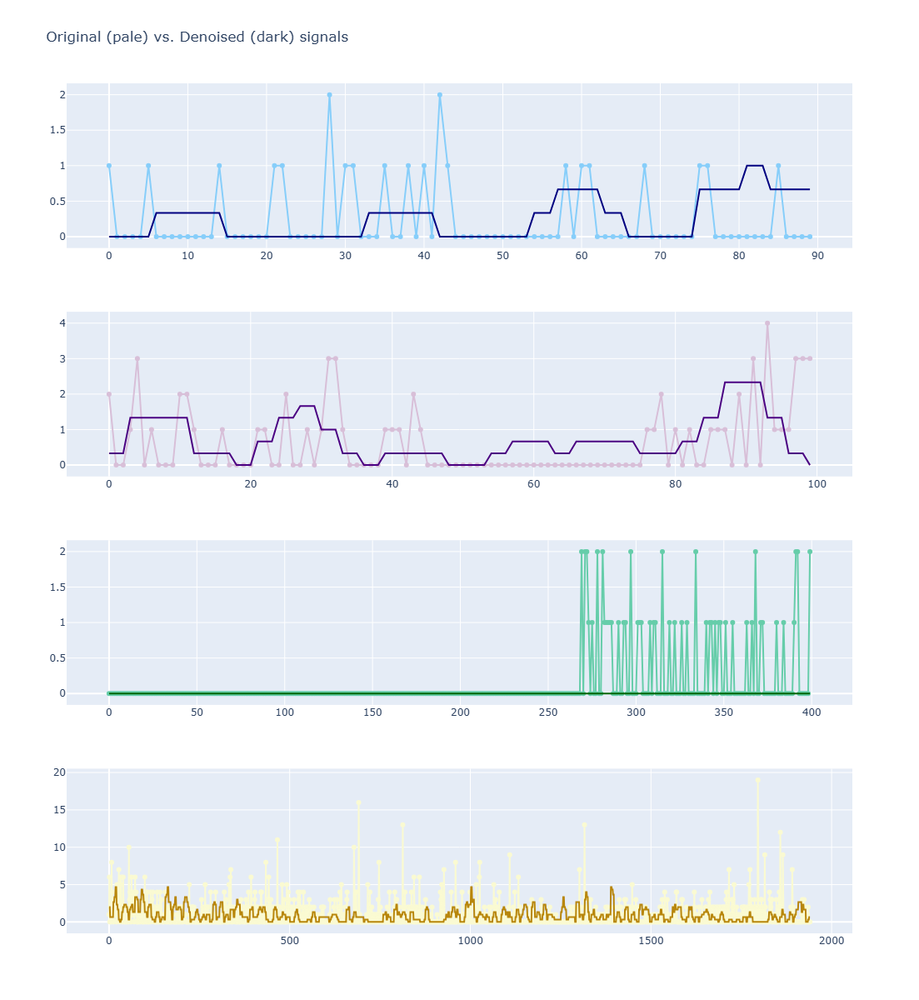

In [40]:
def average_smoothing(signal, kernel_size=3, stride=1):
    sample = []
    start = 0
    end = kernel_size
    while end <= len(signal):
        start = start + stride
        end = end + stride
        sample.extend(np.ones(end - start)*np.mean(signal[start:end]))
    return np.array(sample)

y_a1 = average_smoothing(sample_1)
y_a2 = average_smoothing(sample_2)
y_a3 = average_smoothing(sample_3)
y_a4 = average_smoothing(sample_4)

fig = make_subplots(rows=4, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_1)), mode='lines+markers', y=sample_1, marker=dict(color="lightskyblue"), showlegend=False,
               name="Original sales"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_1)), y=y_a1, mode='lines', marker=dict(color="navy"), showlegend=False,
               name="Denoised sales"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_2)), mode='lines+markers', y=sample_2, marker=dict(color="thistle"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_2)), y=y_a2, mode='lines', marker=dict(color="indigo"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_3)), mode='lines+markers', y=sample_3, marker=dict(color="mediumaquamarine"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_3)), y=y_a3, mode='lines', marker=dict(color="darkgreen"), showlegend=False),
    row=3, col=1
)



fig.add_trace(
    go.Scatter(x=np.arange(len(sample_4)), mode='lines+markers', y=sample_4, marker=dict(color="lightgoldenrodyellow"), showlegend=False),
    row=4, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(len(sample_4)), y=y_a4, mode='lines', marker=dict(color="darkgoldenrod"), showlegend=False),
    row=4, col=1
)

fig.update_layout(height=1200, width=800, title_text="Original (pale) vs. Denoised (dark) signals")
fig.show()

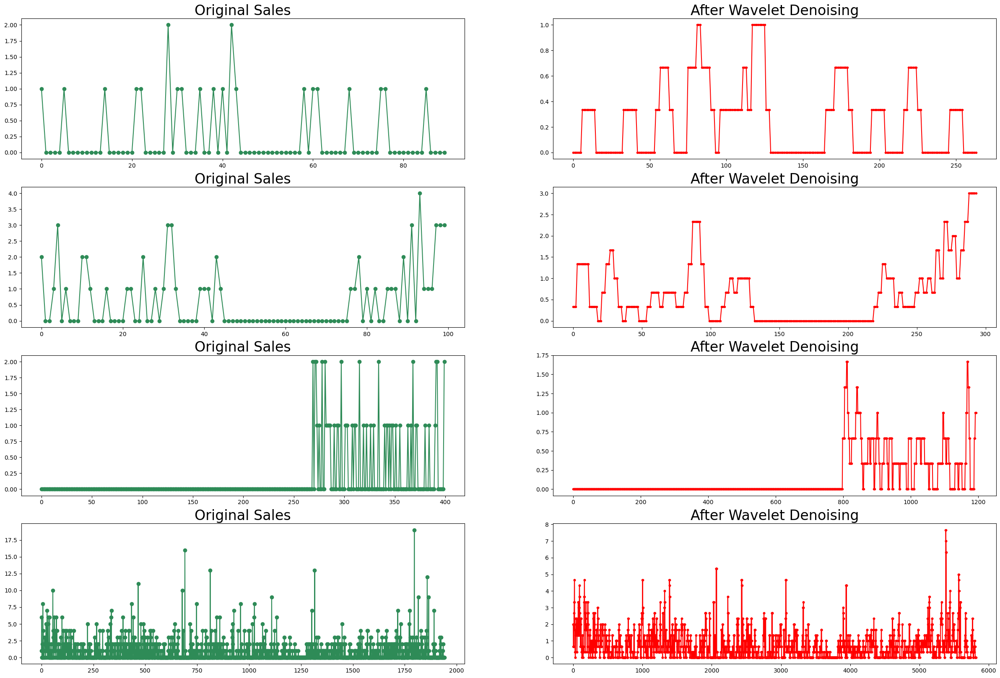

In [42]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(30, 20))

ax[0, 0].plot(sample_1, color='seagreen', marker='o') 
ax[0, 0].set_title('Original Sales', fontsize=24)
ax[0, 1].plot(y_a1, color='red', marker='.') 
ax[0, 1].set_title('After Wavelet Denoising', fontsize=24)

ax[1, 0].plot(sample_2, color='seagreen', marker='o') 
ax[1, 0].set_title('Original Sales', fontsize=24)
ax[1, 1].plot(y_a2, color='red', marker='.') 
ax[1, 1].set_title('After Wavelet Denoising', fontsize=24)

ax[2, 0].plot(sample_3, color='seagreen', marker='o') 
ax[2, 0].set_title('Original Sales', fontsize=24)
ax[2, 1].plot(y_a3, color='red', marker='.') 
ax[2, 1].set_title('After Wavelet Denoising', fontsize=24)


ax[3, 0].plot(sample_4, color='seagreen', marker='o') 
ax[3, 0].set_title('Original Sales', fontsize=24)
ax[3, 1].plot(y_a4, color='red', marker='.') 
ax[3, 1].set_title('After Wavelet Denoising', fontsize=24)


plt.show()

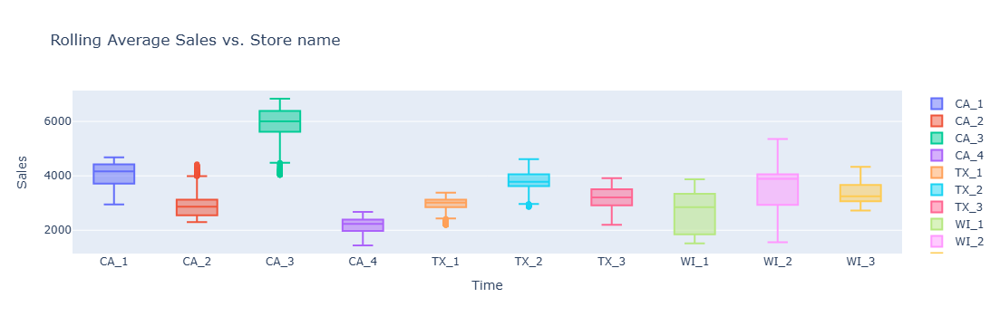

In [46]:
past_sales = sales_train_df.set_index('id')[d_cols] \
    .T \
    .merge(calendar_df.set_index('d')['date'],
           left_index=True,
           right_index=True,
            validate='1:1') \
    .set_index('date')

store_list = sales_price_df['store_id'].unique()

means = []
fig = go.Figure()
for s in store_list:
    store_items = [c for c in past_sales.columns if s in c]
    data = past_sales[store_items].sum(axis=1).rolling(90).mean()
    means.append(np.mean(past_sales[store_items].sum(axis=1)))
    fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (per store)")

fig = go.Figure()

for i, s in enumerate(store_list):
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name ")

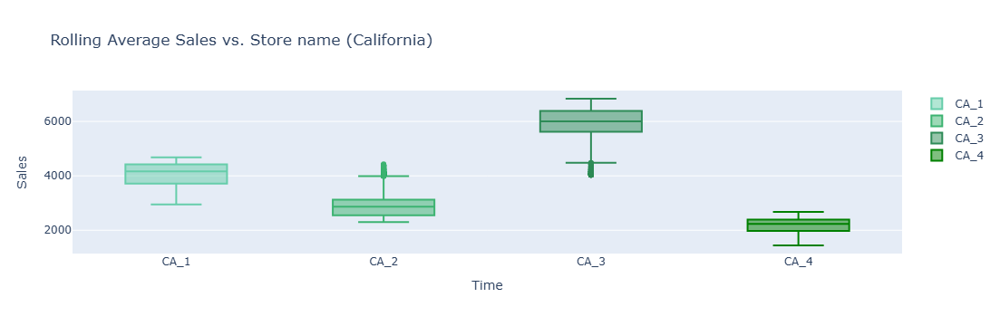

In [48]:
df = pd.DataFrame(np.transpose([means, store_list]))
df.columns = ["Mean sales", "Store name"]
px.bar(df, y="Mean sales", x="Store name", color="Store name", title="Mean sales vs. Store name")
greens = ["mediumaquamarine", "mediumseagreen", "seagreen", "green"]
store_list = sales_price_df['store_id'].unique()
means = []
stores = []
fig = go.Figure()
for i, s in enumerate(store_list):
    if "ca" in s or "CA" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        means.append(np.mean(past_sales[store_items].sum(axis=1)))
        stores.append(s)
        fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s, marker=dict(color=greens[i])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (California)")
fig = go.Figure()

for i, s in enumerate(store_list):
    if "ca" in s or "CA" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s, marker=dict(color=greens[i])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name (California)")

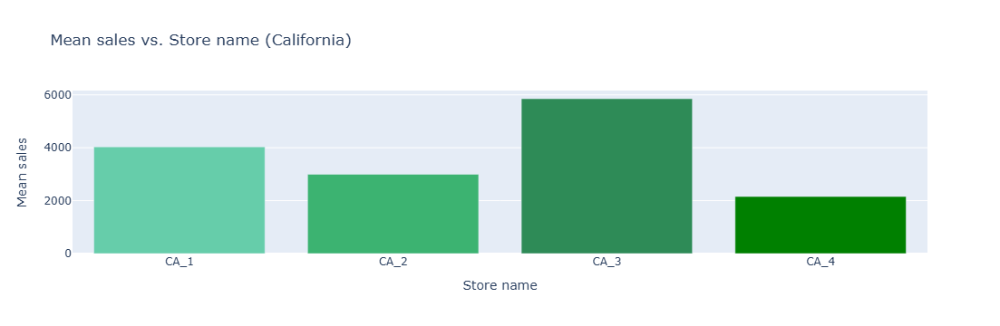

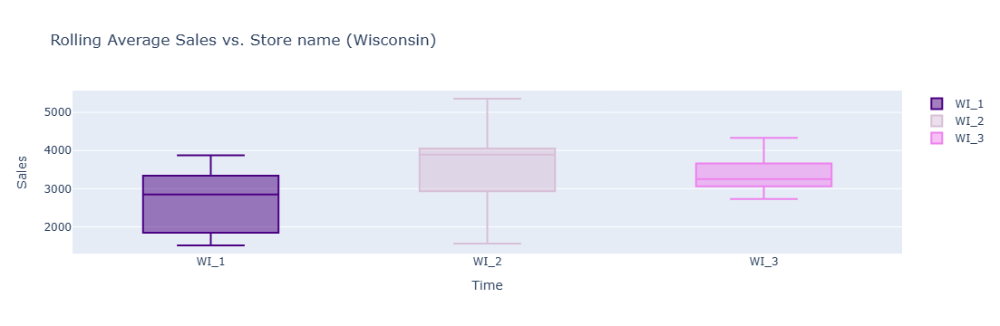

In [50]:
df = pd.DataFrame(np.transpose([means, stores]))
df.columns = ["Mean sales", "Store name"]
px.bar(df, y="Mean sales", x="Store name", color="Store name", title="Mean sales vs. Store name", color_continuous_scale=greens)


fig = go.Figure(data=[
    go.Bar(name='', x=stores, y=means, marker={'color' : greens})])

fig.update_layout(title="Mean sales vs. Store name (California)", yaxis=dict(title="Mean sales"), xaxis=dict(title="Store name"))
fig.update_layout(barmode='group')
fig.show()
purples = ["thistle", "violet", "purple", "indigo"]
store_list = sales_price_df['store_id'].unique()
means = []
stores = []

fig = go.Figure()
for i, s in enumerate(store_list):
    if "wi" in s or "WI" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        means.append(np.mean(past_sales[store_items].sum(axis=1)))
        stores.append(s)
        fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s, marker=dict(color=purples[i%len(purples)])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (Wisconsin)")

fig = go.Figure()

for i, s in enumerate(store_list):
    if "wi" in s or "WI" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s, marker=dict(color=purples[i%len(purples)])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name (Wisconsin)")

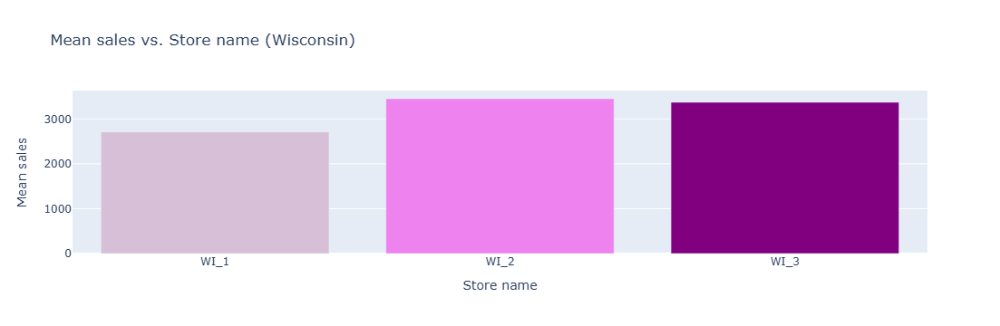

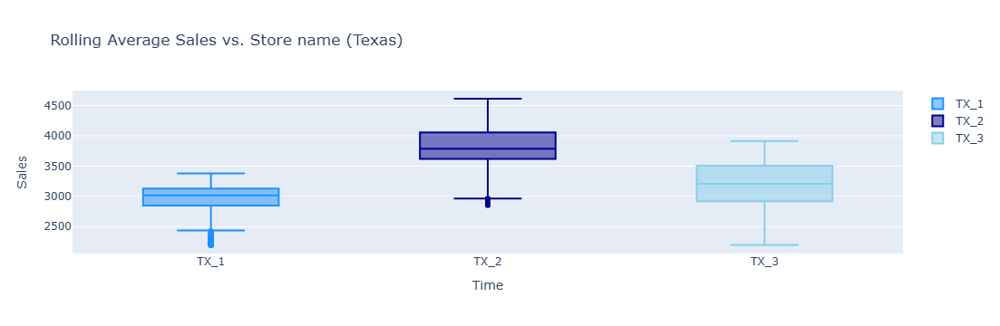

In [52]:
df = pd.DataFrame(np.transpose([means, stores]))
df.columns = ["Mean sales", "Store name"]
px.bar(df, y="Mean sales", x="Store name", color="Store name", title="Mean sales vs. Store name", color_continuous_scale=greens)


fig = go.Figure(data=[
    go.Bar(name='', x=stores, y=means, marker={'color' : purples})])

fig.update_layout(title="Mean sales vs. Store name (Wisconsin)", yaxis=dict(title="Mean sales"), xaxis=dict(title="Store name"))
fig.update_layout(barmode='group')
fig.show()

blues = ["skyblue", "dodgerblue", "darkblue"]
store_list = sales_price_df['store_id'].unique()

means = []
stores = []

fig = go.Figure()
for i, s in enumerate(store_list):
    if "tx" in s or "TX" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        means.append(np.mean(past_sales[store_items].sum(axis=1)))
        stores.append(s)
        fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s, marker=dict(color=blues[i%len(blues)])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (Texas)")

fig = go.Figure()

for i, s in enumerate(store_list):
    if "tx" in s or "TX" in s:
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s, marker=dict(color=blues[i%len(blues)])))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name (Texas)")

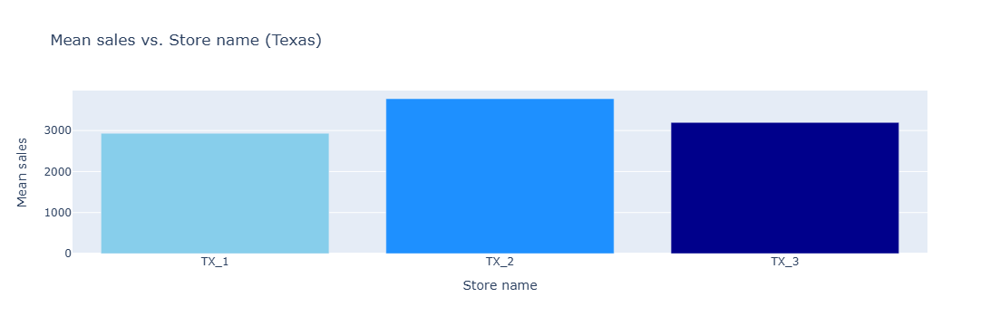

In [54]:
df = pd.DataFrame(np.transpose([means, stores]))
df.columns = ["Mean sales", "Store name"]
px.bar(df, y="Mean sales", x="Store name", color="Store name", title="Mean sales vs. Store name", color_continuous_scale=greens)


fig = go.Figure(data=[
    go.Bar(name='', x=stores, y=means, marker={'color' : blues})])

fig.update_layout(title="Mean sales vs. Store name (Texas)", yaxis=dict(title="Mean sales"), xaxis=dict(title="Store name"))
fig.update_layout(barmode='group')
fig.show()

In [56]:
train_dataset = sales_train_df[d_cols[-100:-30]]
val_dataset = sales_train_df[d_cols[-30:]]

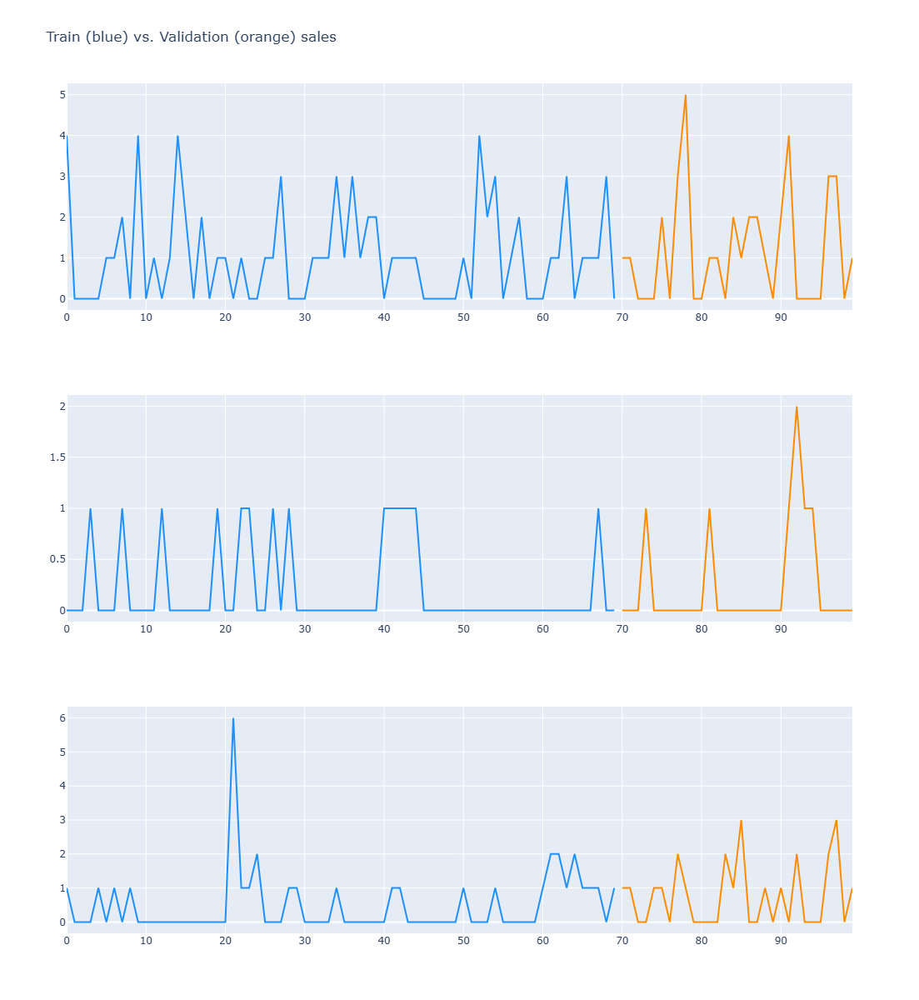

In [58]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"), showlegend=False,
               name="Original signal"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"), showlegend=False,
               name="Denoised signal"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Train (blue) vs. Validation (orange) sales")
fig.show()

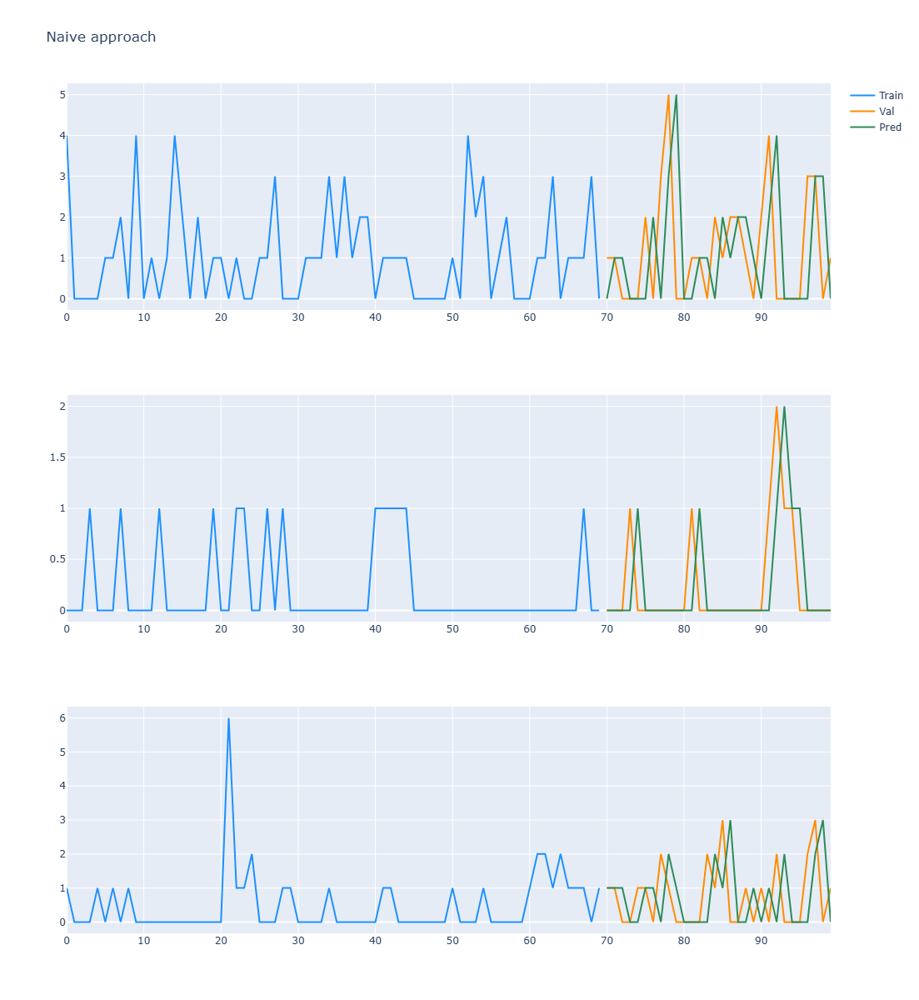

In [60]:
predictions = []
for i in range(len(val_dataset.columns)):
    if i == 0:
        predictions.append(train_dataset[train_dataset.columns[-1]].values)
    else:
        predictions.append(val_dataset[val_dataset.columns[i-1]].values)
    
predictions = np.transpose(np.array([row.tolist() for row in predictions]))
error_naive = np.linalg.norm(predictions[:3] - val_dataset.values[:3])/len(predictions[0])




pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Naive approach")
fig.show()

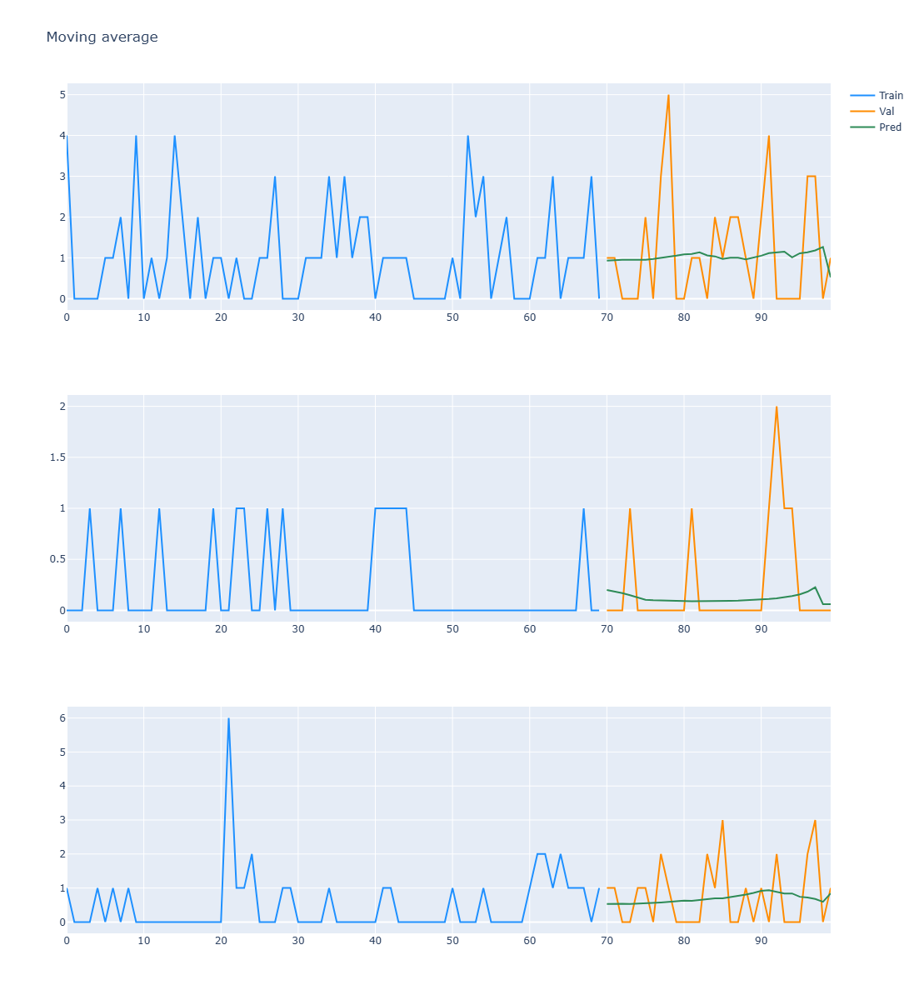

In [62]:
predictions = []
for i in range(len(val_dataset.columns)):
    if i == 0:
        predictions.append(np.mean(train_dataset[train_dataset.columns[-30:]].values, axis=1))
    if i < 31 and i > 0:
        predictions.append(0.5 * (np.mean(train_dataset[train_dataset.columns[-30+i:]].values, axis=1) + \
                                  np.mean(predictions[:i], axis=0)))
    if i > 31:
        predictions.append(np.mean([predictions[:i]], axis=1))
    
predictions = np.transpose(np.array([row.tolist() for row in predictions]))
error_avg = np.linalg.norm(predictions[:3] - val_dataset.values[:3])/len(predictions[0])



pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Moving average")
fig.show()

  0%|          | 0/3 [00:00<?, ?it/s]

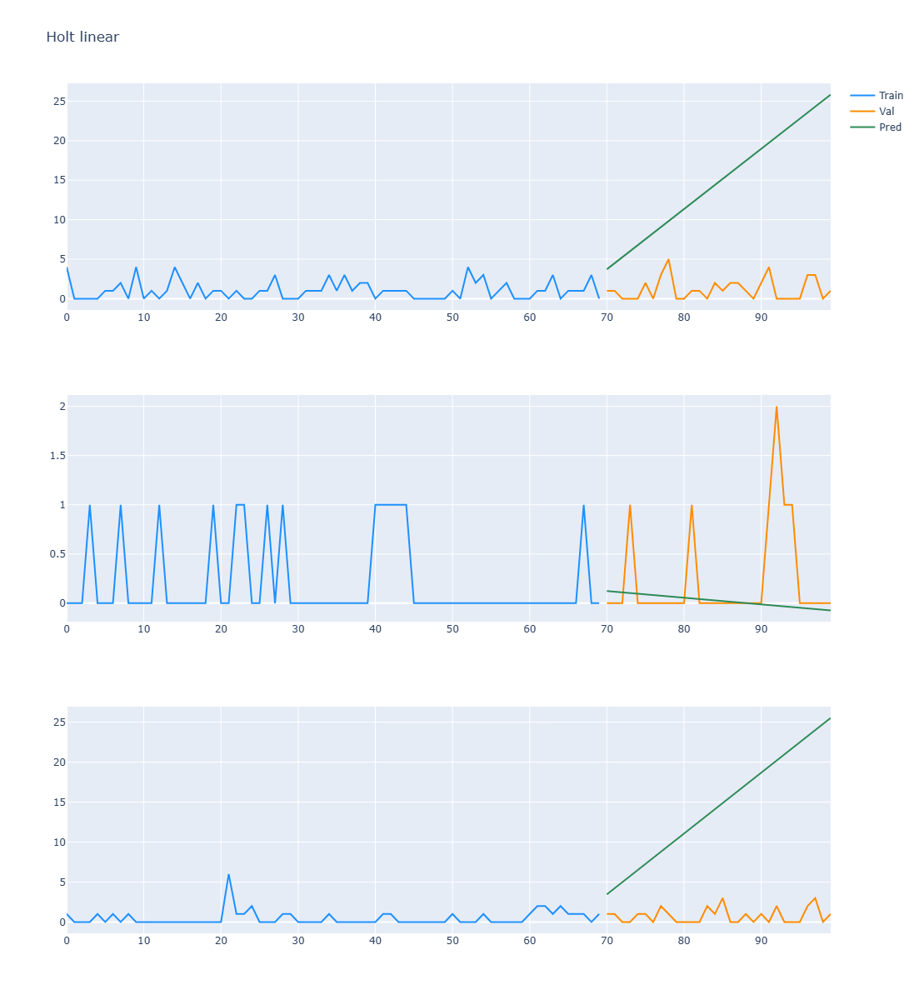

In [64]:
predictions = []
for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
    fit = Holt(row).fit(smoothing_level = 0.3, smoothing_slope = 0.01)
    predictions.append(fit.forecast(30))
predictions = np.array(predictions).reshape((-1, 30))
error_holt = np.linalg.norm(predictions - val_dataset.values[:len(predictions)])/len(predictions[0])



pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Holt linear")
fig.show()

  0%|          | 0/3 [00:00<?, ?it/s]

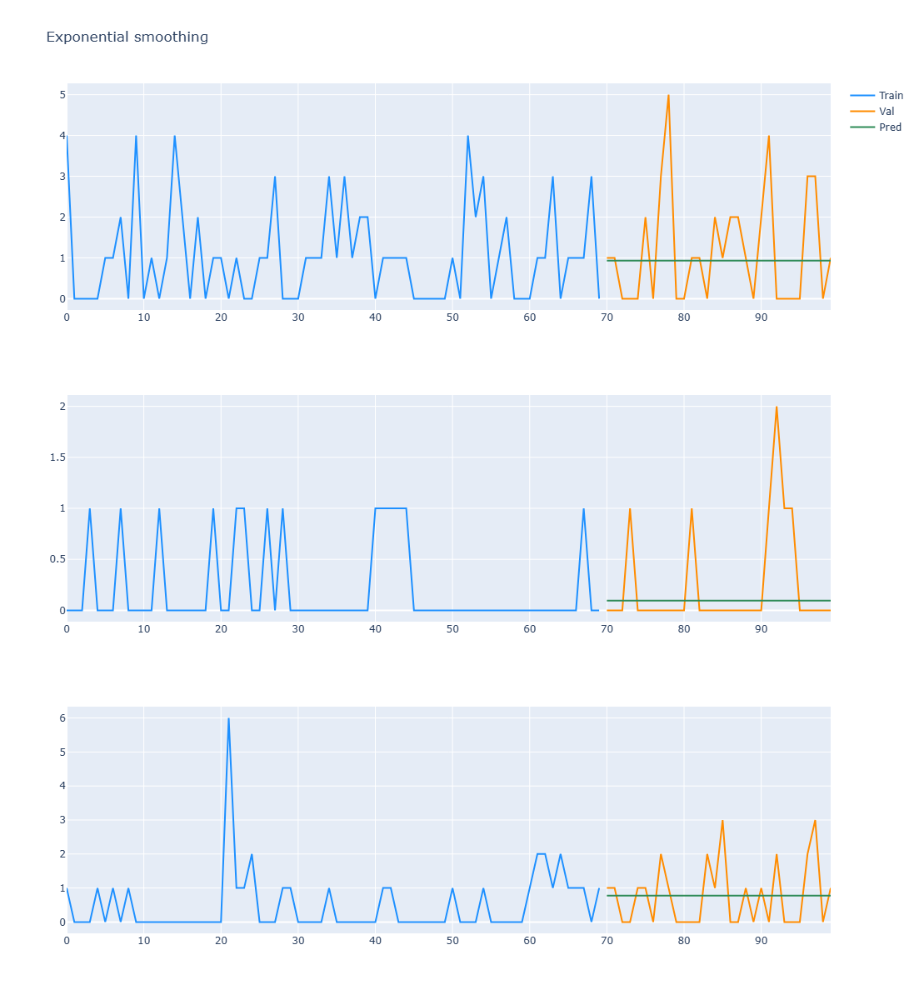

In [66]:
predictions = []
for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
    fit = ExponentialSmoothing(row, seasonal_periods=3).fit()
    predictions.append(fit.forecast(30))
predictions = np.array(predictions).reshape((-1, 30))
error_exponential = np.linalg.norm(predictions[:3] - val_dataset.values[:3])/len(predictions[0])


pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Exponential smoothing")
fig.show()

  0%|          | 0/3 [00:00<?, ?it/s]

ARIMA Validation Error (norm): 0.3082


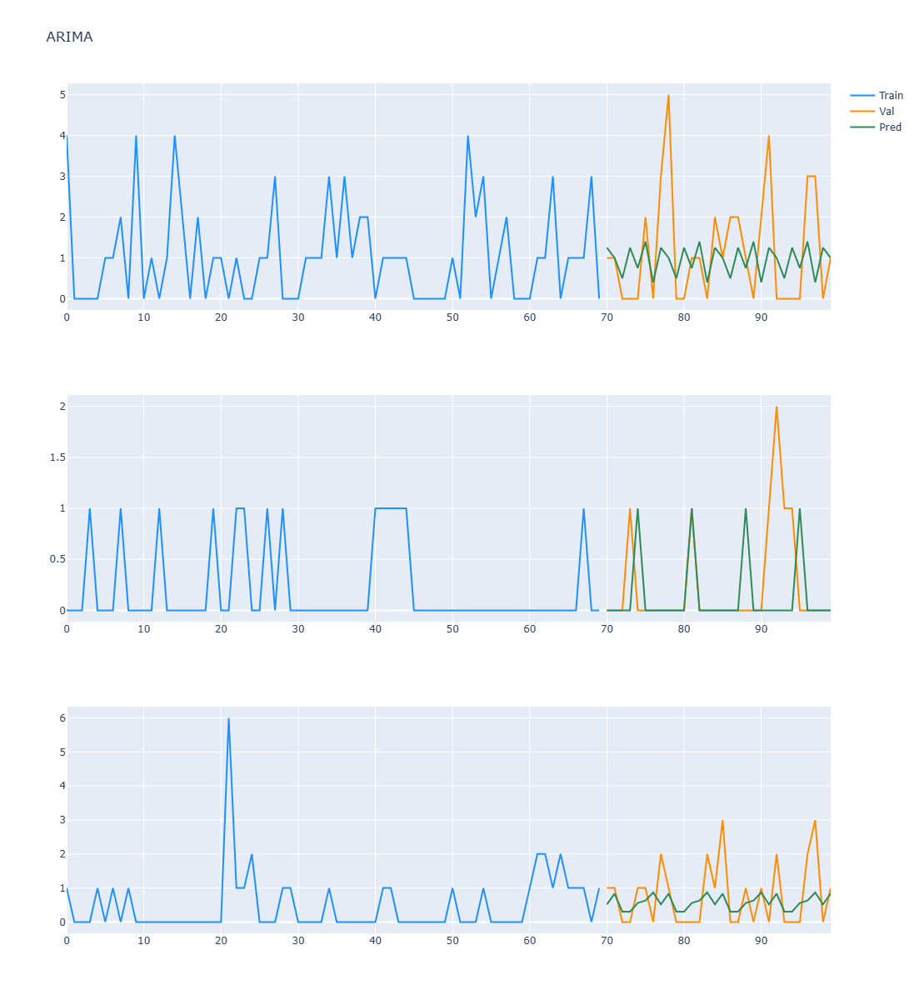

In [78]:
predictions = []

# Forecast next 30 points for the first 3 time series using ARIMA
for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
    fit = ARIMA(row, seasonal_order=(0, 1, 1, 7)).fit()
    predictions.append(fit.forecast(30))

# Convert to numpy array
predictions = np.array(predictions).reshape((-1, 30))

# Calculate validation error (Euclidean norm)
error_arima = np.linalg.norm(predictions[:3] - val_dataset.values[:3]) / len(predictions[0])
print(f"ARIMA Validation Error (norm): {error_arima:.4f}")



pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="ARIMA")
fig.show()

  0%|          | 0/3 [00:00<?, ?it/s]

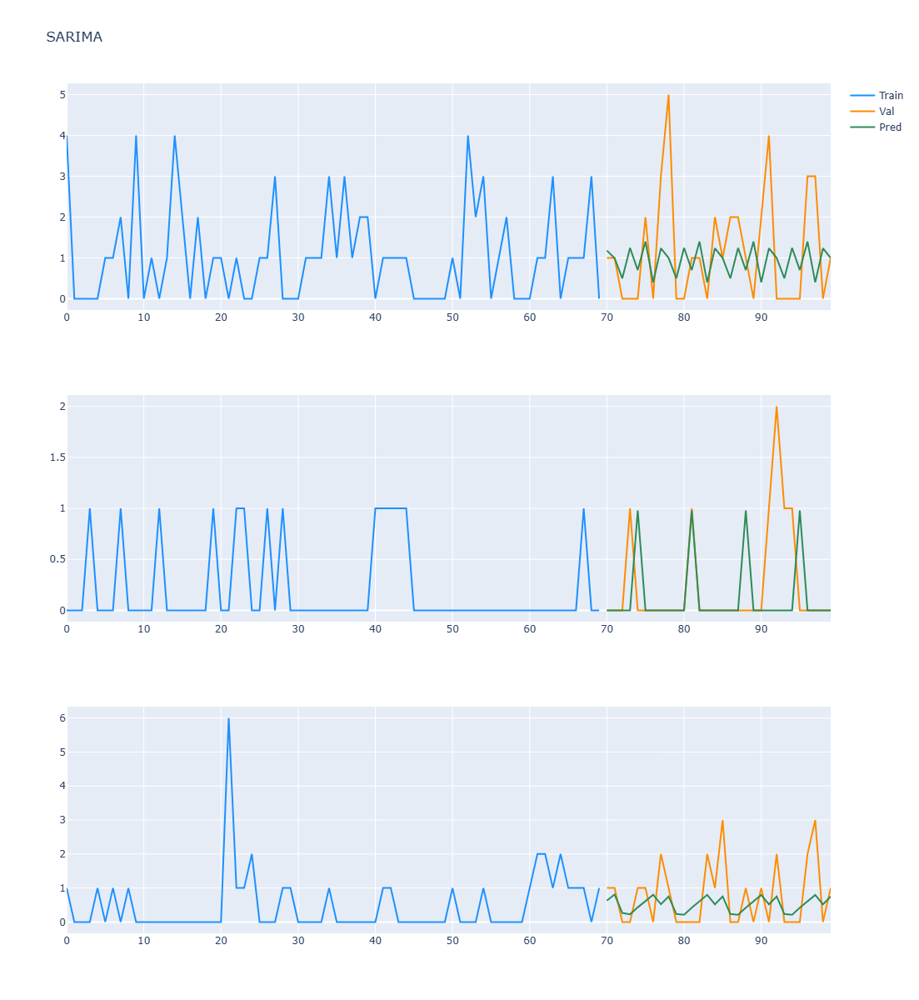

In [80]:
predictions = []
for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
    fit = sm.tsa.statespace.SARIMAX(row, seasonal_order=(0, 1, 1, 7)).fit()
    predictions.append(fit.forecast(30))
predictions = np.array(predictions).reshape((-1, 30))
error_sarima = np.linalg.norm(predictions[:3] - val_dataset.values[:3])/len(predictions[0])


pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="SARIMA")
fig.show()

In [82]:
dates = ["2007-12-" + str(i) for i in range(1, 31)]

  0%|          | 0/3 [00:00<?, ?it/s]

04:40:05 - cmdstanpy - INFO - Chain [1] start processing
04:40:06 - cmdstanpy - INFO - Chain [1] done processing
04:40:06 - cmdstanpy - INFO - Chain [1] start processing
04:40:06 - cmdstanpy - INFO - Chain [1] done processing
04:40:06 - cmdstanpy - INFO - Chain [1] start processing
04:40:06 - cmdstanpy - INFO - Chain [1] done processing


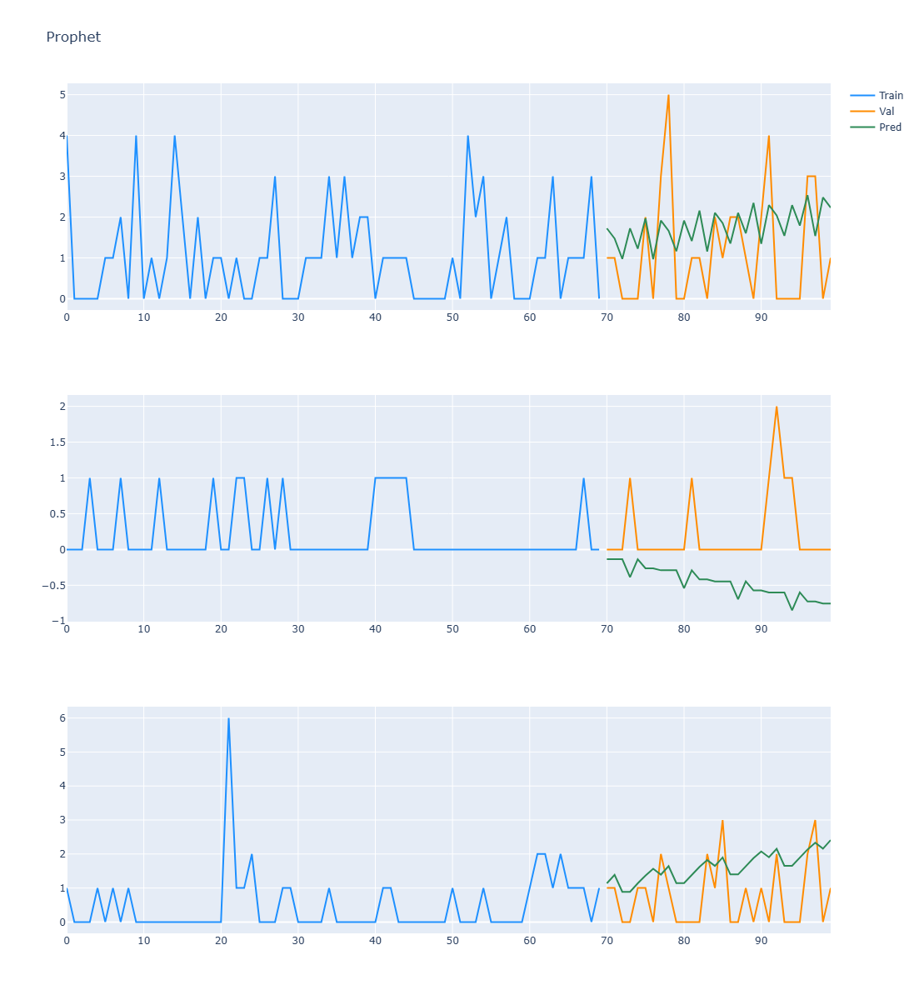

In [84]:
predictions = []

for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
    df = pd.DataFrame(np.transpose([dates, row]))
    df.columns = ["ds", "y"]
    model = Prophet(daily_seasonality=True)
    model.fit(df)
    future = model.make_future_dataframe(periods=30)
    forecast = model.predict(future)["yhat"].loc[30:].values
    predictions.append(forecast)

predictions = np.array(predictions).reshape((-1, 30))
error_prophet = np.linalg.norm(predictions[:3] - val_dataset.values[:3])/len(predictions[0])

pred_1 = predictions[0]
pred_2 = predictions[1]
pred_3 = predictions[2]


fig = make_subplots(rows=3, cols=1)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[0].values, marker=dict(color="dodgerblue"),
               name="Train"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[0].values, mode='lines', marker=dict(color="darkorange"),
               name="Val"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_1, mode='lines', marker=dict(color="seagreen"),
               name="Pred"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[1].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[1].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_2, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70), mode='lines', y=train_dataset.loc[2].values, marker=dict(color="dodgerblue"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=val_dataset.loc[2].values, mode='lines', marker=dict(color="darkorange"), showlegend=False),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=np.arange(70, 100), y=pred_3, mode='lines', marker=dict(color="seagreen"), showlegend=False,
               name="Denoised signal"),
    row=3, col=1
)

fig.update_layout(height=1200, width=800, title_text="Prophet")
fig.show()

In [88]:
days = range(1, 1913 + 1)
time_series_columns = [f'd_{i}' for i in days]
time_series_data = sales_train_df[time_series_columns]
forecast = pd.DataFrame(time_series_data.iloc[:, -28:].mean(axis=1))
forecast = pd.concat([forecast] * 28, axis=1)
forecast.columns = [f'F{i}' for i in range(1, forecast.shape[1] + 1)]
validation_ids = sales_train_df['id'].values
evaluation_ids = [i.replace('validation', 'evaluation') for i in validation_ids]
ids = np.concatenate([validation_ids, evaluation_ids])
predictions = pd.DataFrame(ids, columns=['id'])
forecast = pd.concat([forecast] * 2).reset_index(drop=True)
predictions = pd.concat([predictions, forecast], axis=1)
predictions.to_csv('Results.csv', index=False)
error = [error_naive, error_avg, error_holt, error_exponential, error_arima,  error_sarima, error_prophet]
names = ["Naive approach", "Moving average", "Holt linear", "Exponential smoothing", "ARIMA", "SARIMA","Prophet"]

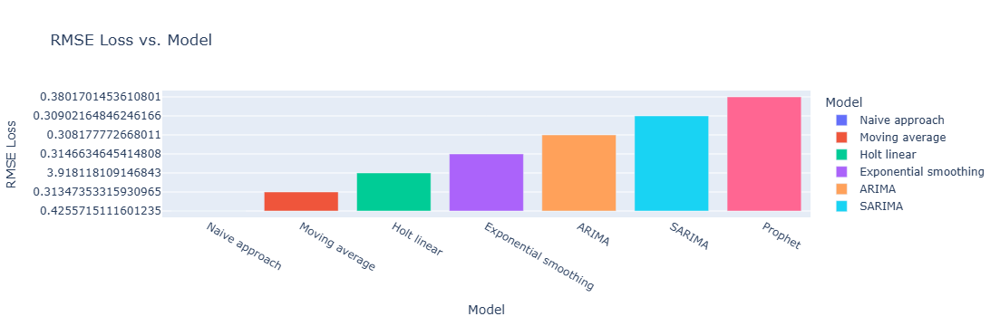

In [90]:
df = pd.DataFrame(np.transpose([error, names]))
df.columns = ["RMSE Loss", "Model"]

px.bar(df, y="RMSE Loss", x="Model", color="Model", title="RMSE Loss vs. Model")

In [96]:
# Load Data
calendar_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\calendar.csv')
sales_price_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\sales_price.csv')
sales_train_df = pd.read_csv(r'C:\Users\bhanu\Downloads\Wallmart-5-DS-AB-TS\Dataset\sales_train.csv')

In [98]:
# Melt sales_train_df to long format (item_id, store_id, day -> sales)
id_vars = ['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']
sales_long = pd.melt(sales_train_df, 
                     id_vars=id_vars, 
                     var_name='d', 
                     value_name='sales')

In [ ]:
# Merge with calendar data (for date features)
data = sales_long.merge(calendar_df, on='d', how='left')

# Merge with price data
data = data.merge(sales_price_df, on=['store_id', 'item_id', 'wm_yr_wk'], how='left')

# Drop rows with missing price or event info
data = data.dropna(subset=['sell_price'])

In [102]:
sales_train = pd.read_csv("sales_train.csv")
calendar = pd.read_csv("calendar.csv")
sales_price = pd.read_csv("sales_price.csv")

In [112]:
# Handle missing values
sales_train = sales_train.ffill()
calendar = calendar.ffill()
sales_price = sales_price.ffill()

In [114]:
# Use a smaller sample for development
sales_train_sample = sales_train.iloc[:500]  # Use 500 rows for demo; adjust as needed

# Melt the sample
id_vars = ['id', 'item_id', 'dept_id', 'cat_id', 'store_id']
value_vars = [col for col in sales_train_sample.columns if 'd_' in col]
df_melted = sales_train_sample.melt(id_vars=id_vars, value_vars=value_vars, var_name='day', value_name='demand')

# Reduce memory usage in calendar by selecting only needed columns
calendar = calendar[['d', 'weekday', 'wm_yr_wk', 'event_name_1', 'event_type_1']]

# Merge safely
df_merged = df_melted.merge(calendar, how='left', left_on='day', right_on='d')

# Reduce memory usage in price data
sales_price = sales_price[['store_id', 'item_id', 'wm_yr_wk', 'sell_price']]
df_merged = df_merged.merge(sales_price, how='left', on=['store_id', 'item_id', 'wm_yr_wk'])

# Fill missing values
df_merged.fillna(-1, inplace=True)

# Encode categoricals
cat_cols = ['item_id', 'dept_id', 'cat_id', 'store_id', 'event_name_1', 'event_type_1', 'weekday']
for col in cat_cols:
    df_merged[col] = df_merged[col].astype('category').cat.codes

# Feature matrix and target
features = ['item_id', 'dept_id', 'cat_id', 'store_id', 'event_name_1', 'event_type_1', 'weekday', 'sell_price']
X = df_merged[features]
y = df_merged['demand']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

TRAINING MODELS

In [117]:
# XGBoost
xgb_model = XGBRegressor(objective="reg:squarederror", n_estimators=100)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)

In [119]:
# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)

In [121]:
# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

In [123]:
# Deep Learning
dl_model = Sequential()
dl_model.add(Input(shape=(X_train.shape[1],)))
dl_model.add(Dense(128, activation='relu'))
dl_model.add(Dense(64, activation='relu'))
dl_model.add(Dense(1))
dl_model.compile(optimizer='adam', loss='mean_squared_error')
dl_model.fit(X_train, y_train, epochs=10, batch_size=64, verbose=1)
dl_preds = dl_model.predict(X_test).flatten()

Epoch 1/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 888us/step - loss: 9.0698 
Epoch 2/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 11s 914us/step - loss: 7.2038
Epoch 3/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 11s 920us/step - loss: 6.9289
Epoch 4/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 11s 885us/step - loss: 6.9266
Epoch 5/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 963us/step - loss: 6.9869
Epoch 6/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 991us/step - loss: 6.8126
Epoch 7/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 957us/step - loss: 6.7811
Epoch 8/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 11s 932us/step - loss: 6.9627
Epoch 9/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 6.8552  
Epoch 10/10
12132/12132 ━━━━━━━━━━━━━━━━━━━━ 12s 1000us/step - loss: 7.0258
6066/6066 ━━━━━━━━━━━━━━━━━━━━ 3s 516us/step


EVALUATION

In [126]:
def evaluate_model(name, y_true, y_pred):
    print(f"--- {name} ---")
    print("MAE:", mean_absolute_error(y_true, y_pred))
    print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("R2 Score:", r2_score(y_true, y_pred))
    print("")

evaluate_model("XGBoost", y_test, xgb_preds)
evaluate_model("Linear Regression", y_test, lr_preds)
evaluate_model("Random Forest", y_test, rf_preds)
evaluate_model("Deep Learning", y_test, dl_preds)

--- XGBoost ---
MAE: 0.9026519060134888
RMSE: 2.490522444275633
R2 Score: 0.32811057567596436

--- Linear Regression ---
MAE: 1.2512868323993276
RMSE: 3.0135625890376057
R2 Score: 0.016266817314999016

--- Random Forest ---
MAE: 0.9403453378320303
RMSE: 2.7747551766160514
R2 Score: 0.16599965564671681

--- Deep Learning ---
MAE: 1.025115728378296
RMSE: 2.7002255981292076
R2 Score: 0.21020030975341797



XGBOOST FEATURE IMPORTANCE

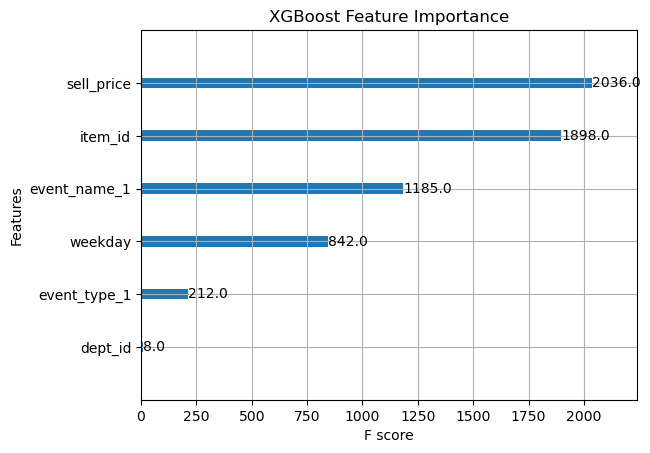

In [135]:
# Feature Importance
xgb.plot_importance(xgb_model)
plt.title("XGBoost Feature Importance")
plt.show()